In [47]:
import os
import glob
import rasterio
import geopandas as gpd
import numpy as np
import fiona
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.features import shapes
from shapely.geometry import shape
import matplotlib.pyplot as plt
%matplotlib inline
from shapely.geometry import box

In [48]:
tif_folder = "Dataset/train"
search_pattern = os.path.join(tif_folder, "Dataset.*.tif")
images = sorted(glob.glob(search_pattern))

In [49]:
# Create a list of images
source_images = []

for image in images:
  img = rasterio.open(image)
  source_images.append(img)
  image_name = os.path.splitext(os.path.basename(image))[0]

source_images

[<open DatasetReader name='Dataset/train\Dataset.0.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.1.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.10.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.11.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.12.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.14.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.17.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.18.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.19.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.21.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.22.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.29.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.30.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.32.tif' mode='r'>,
 <open DatasetReader name='Dataset/train\Dataset.3

In [50]:
shp_folder = "Dataset/train_shp"
search_pattern = os.path.join(shp_folder, "Dataset.*.shp")
shapes = sorted(glob.glob(search_pattern))

In [51]:
# Create a list of images
source_shape = []

for shape in shapes:
  with fiona.open(shape, "r") as shapefile:
    shp = [feature["geometry"] for feature in shapefile]
    shp = list(filter(None, shp))
  source_shape.append(shp)

source_shape

[[fiona.Geometry(coordinates=[[(231417.90128750473, 779900.8475342988), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231408.1158632887, 779907.6390369894), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231390.4504371671, 779926.5435276584), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231389.58226133743, 779929.8042901861), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231420.3060911238, 779937.2999663567), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231411.96751149197, 779951.7147280587), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231395.81632770086, 779948.9978855021), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231420.3060911238, 779956.4483713044), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231414.43536612, 779965.0091620465), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231419.65096577498, 779992.3792572457), ...]], type='Polygon'),
  fiona.Geometry(coordinates=[[(231397.75026742

In [52]:
# Clip image and set unique value on mask area
out_image, out_transforms = [],[]

for i in range(len(source_images)):
  # Clip the raster with Polygon
  out_img, out_transform = mask(source_images[i], source_shape[i], crop=False)
  # Set unique value on mask area
  out_img_unique = np.where(out_img!= 0, 255, out_img)
  # Append to list
  out_image.append(out_img_unique)
  out_transforms.append(out_transform)

In [53]:
# Create mask
mask = []
mask_transpose = []

for i in range(len(out_image)):
  mask_img = np.dstack((out_image[i][0], out_image[i][1], out_image[i][2])).astype('uint8')
  mask.append(mask_img)
  # Transpose mask
  transpose = mask_img.transpose(2, 0, 1)
  mask_transpose.append(transpose)

In [54]:
import gc

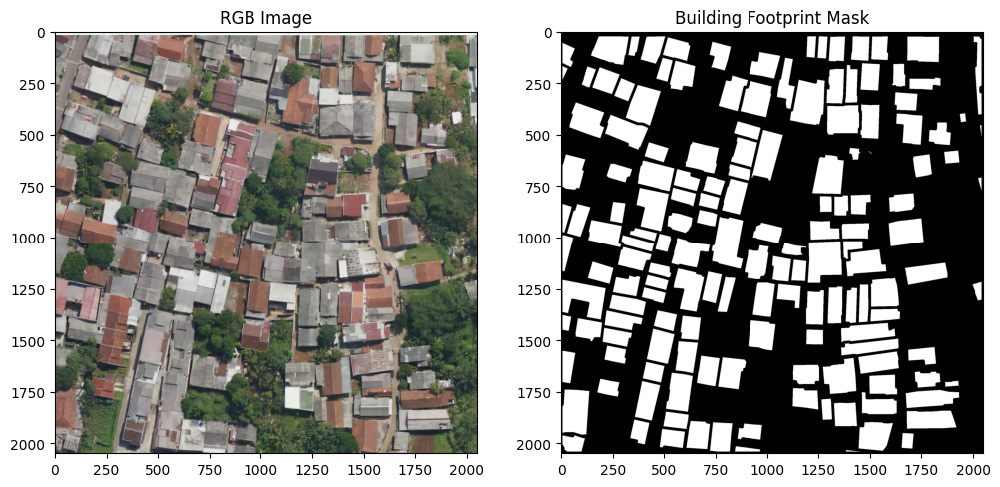

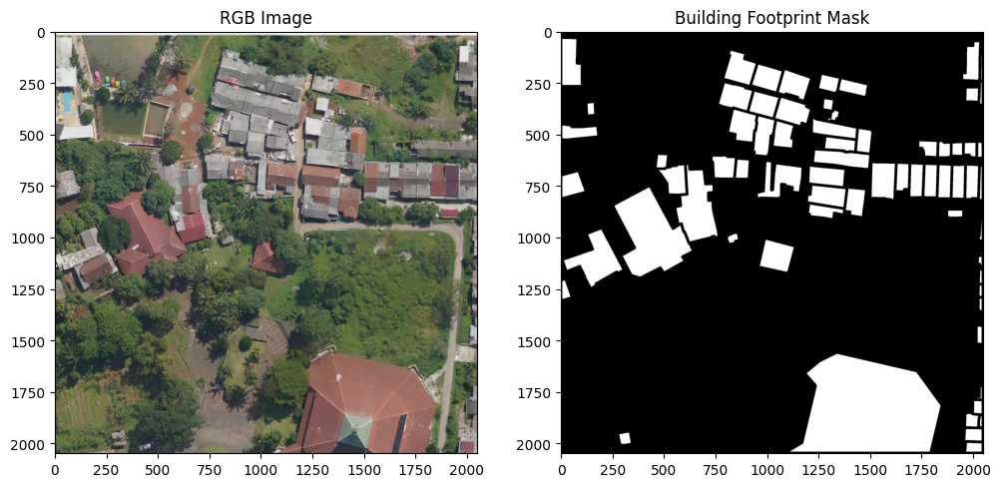

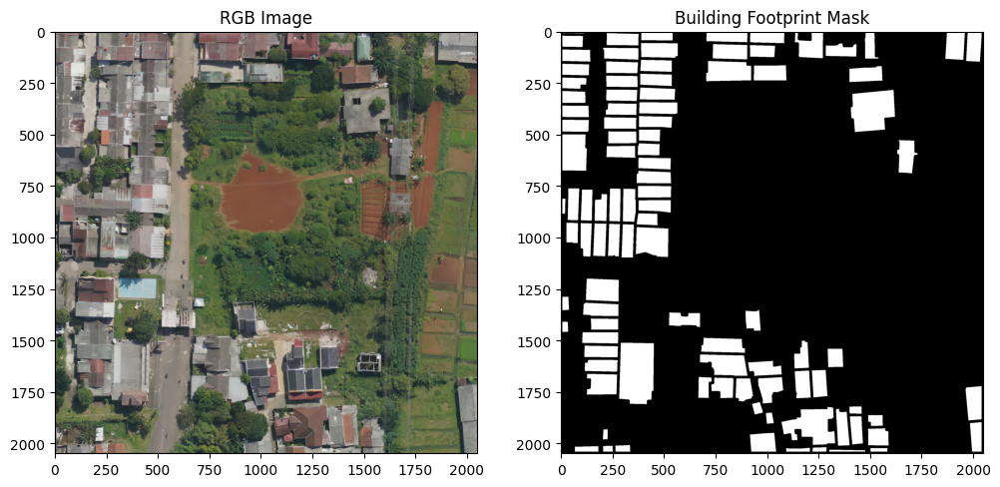

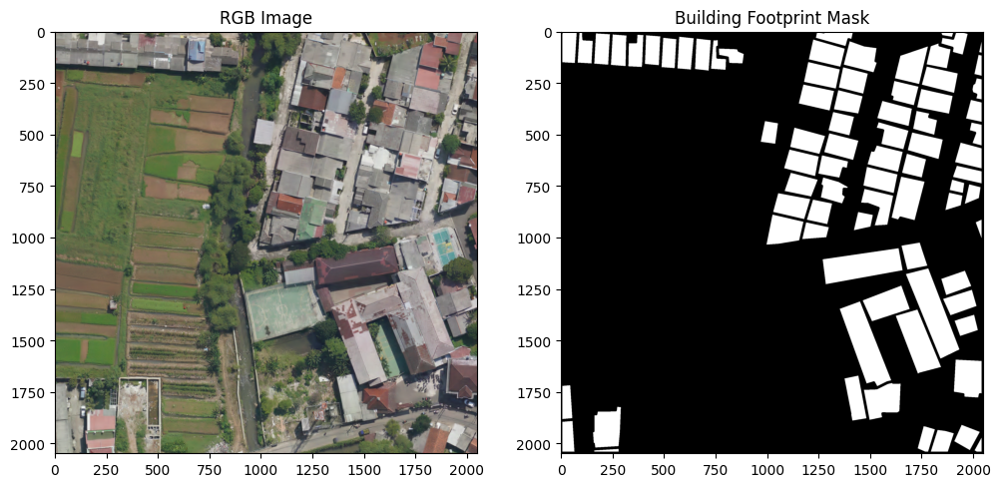

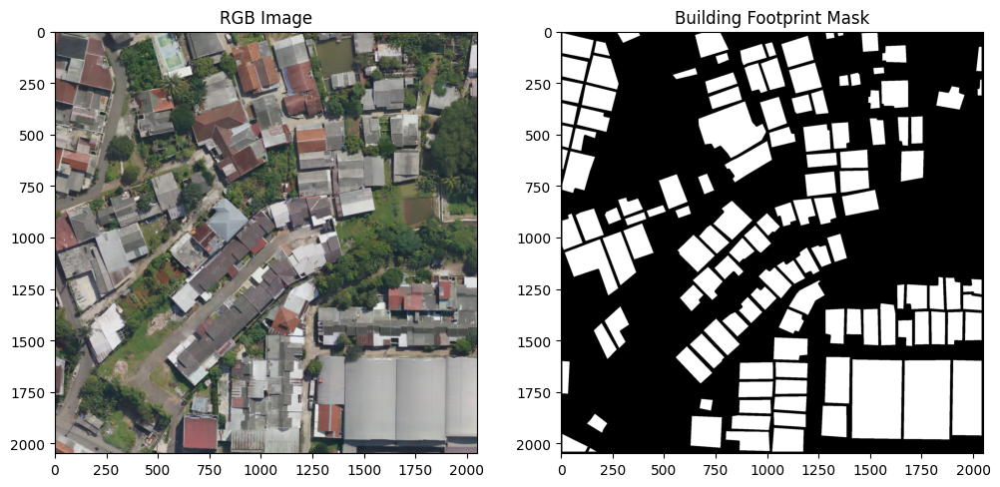

...

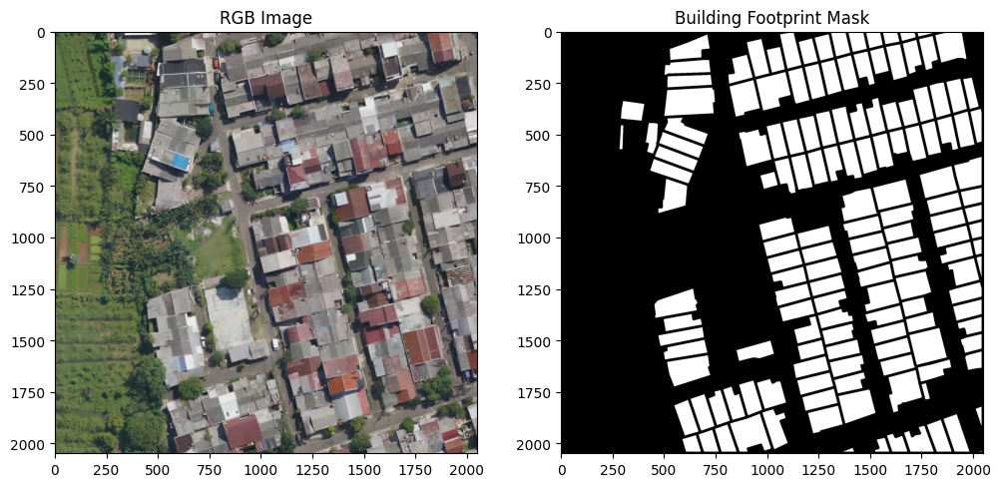

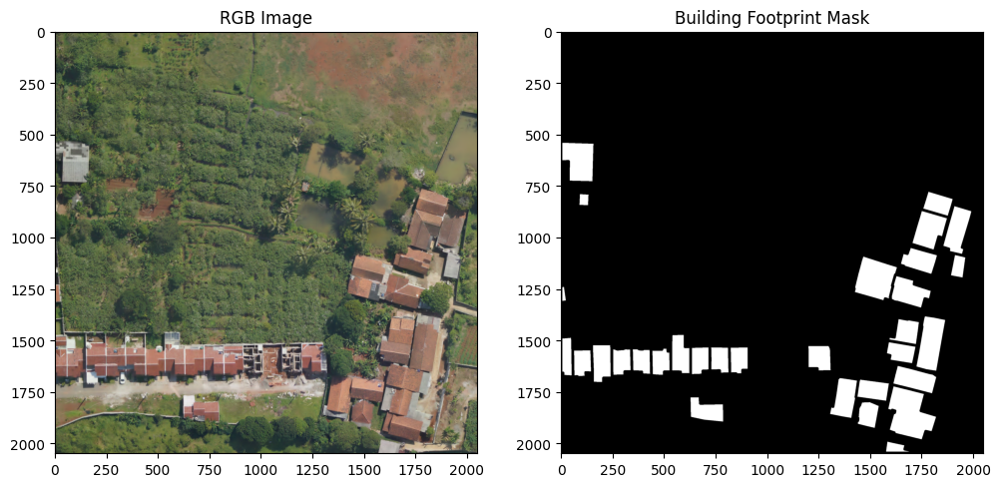

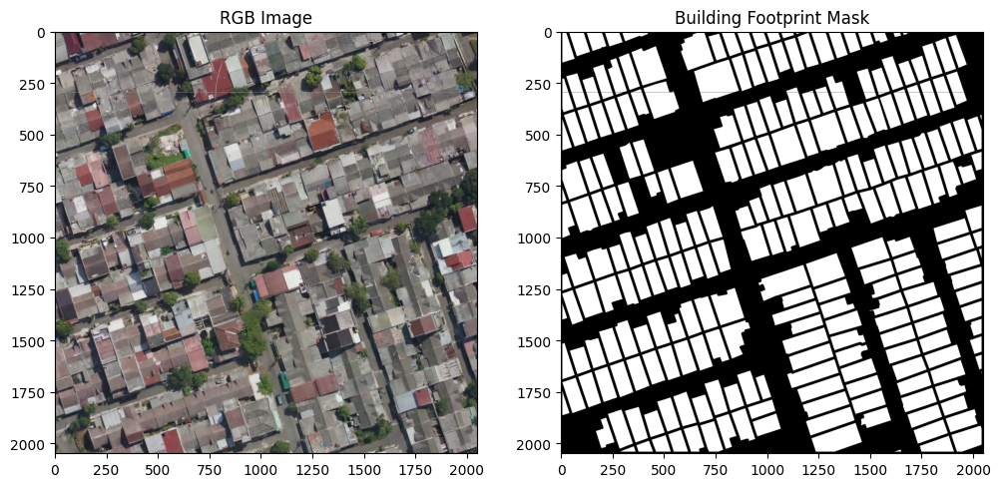

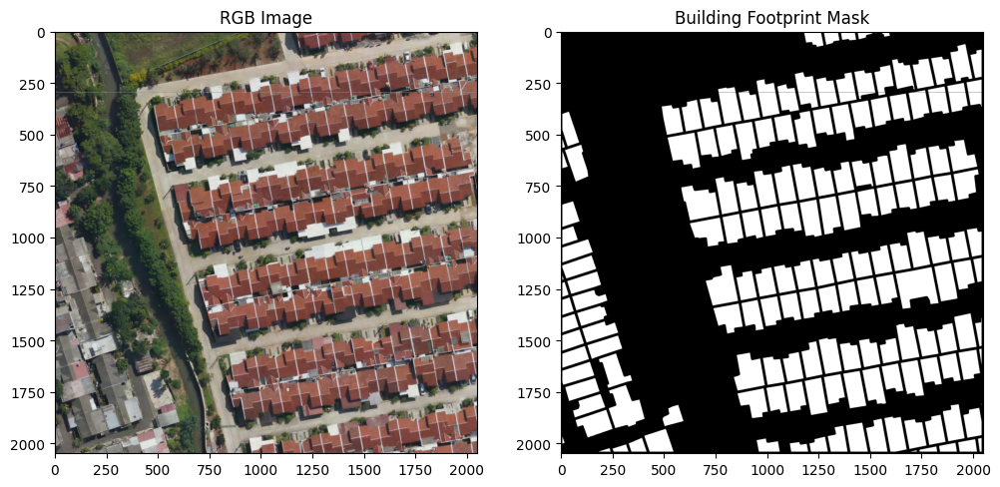

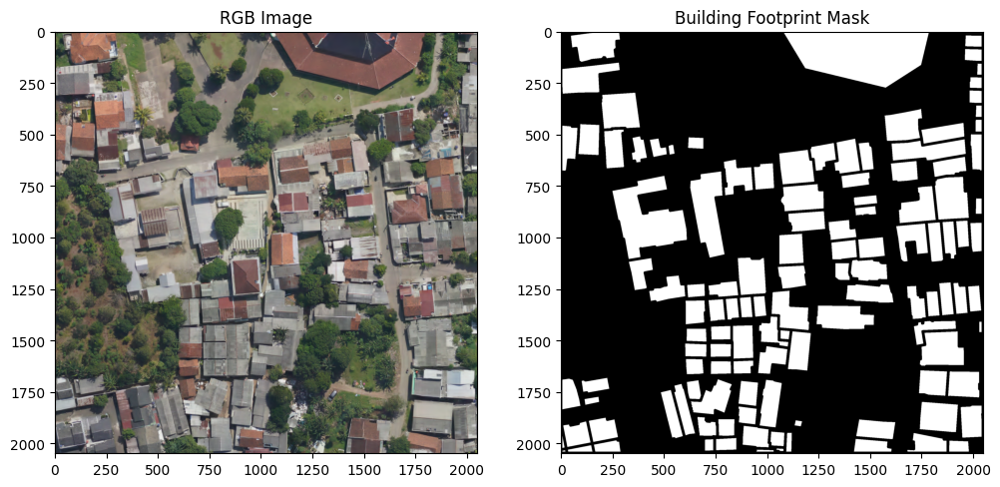

In [55]:
for i in range(len(source_images)):
  # Create subplot
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))

  # Plot RGB image
  ax1.imshow(source_images[i].read().transpose(1, 2, 0))
  ax1.set_title('RGB Image')

  # Plot building footprint
  ax2.imshow(mask[i])
  ax2.set_title('Building Footprint Mask')

  plt.show()

  plt.close(fig)
  gc.collect()

In [56]:
data_dir = "Dataset/train_mask"

for i in range(len(images)):
    # Get base filename without extension
    base_name = os.path.splitext(os.path.basename(images[i]))[0]
    
    # Define output file path
    out_tif = os.path.join(data_dir, f"{base_name}.tif")

    # Copy and update metadata
    out_meta = source_images[i].meta.copy()
    out_meta.update({
        "driver": "GTiff",
        "dtype": 'uint8',
        "height": mask_transpose[i].shape[1],
        "width": mask_transpose[i].shape[2],
        "transform": out_transforms[i],
        "count": 3,
        "crs": source_images[i].crs
    })

    # Save the image
    with rasterio.open(out_tif, "w", **out_meta) as dest:
        dest.write(mask_transpose[i].astype('uint8'))